In [2]:
import pandas as pd
import numpy as np
import nltk
import os
import nltk.corpus
import ssl

In [3]:
from PIL import Image

In [4]:
import matplotlib.pyplot as plt
%matplotlib inline

In [5]:
slok = pd.read_csv('/Users/mr.ravirajkumar/Documents/TextWrap/Vishnu_Sahasram.csv', header= 1)

In [6]:
slok

,Unnamed: 0,Line ID,Script,Length,Unnamed: 4,Unnamed: 5,Unnamed: 6
0,NaN,1,"Shuklam Baradaram Vishnum, Sasi Varnam Chatur ...",53,NaN,NaN,NaN
1,NaN,2,"Prasanna Vadanan Dyayet, Sarva Vignoba Sandaye",46,NaN,NaN,NaN
2,NaN,3,"Vyasam Vasishtanaptharam, Sakthe Poutramakalma...",51,NaN,NaN,NaN
3,NaN,4,"Parasarathma- jam vande, Shukathatham Taponidhim.",49,NaN,NaN,NaN
4,NaN,5,"Vyasa Vishnu Roopaya, Vyasa Roopaya Vishnave,",45,NaN,NaN,NaN
...,...,...,...,...,...,...,...
384,NaN,385,Kayena-Vaacha Mana-Sendhriyerva,31,NaN,NaN,NaN
385,NaN,386,Buddhyatma-Na- avaa Prakrute-Swabhawat,38,NaN,NaN,NaN
386,NaN,387,Karomi Yadyat Sakalam Parasmai,30,NaN,NaN,NaN
387,NaN,388,Naaraa-Yanayeti Samarpayami,27,NaN,NaN,NaN


In [7]:
slok

,Unnamed: 0,Line ID,Script,Length,Unnamed: 4,Unnamed: 5,Unnamed: 6
0,NaN,1,"Shuklam Baradaram Vishnum, Sasi Varnam Chatur ...",53,NaN,NaN,NaN
1,NaN,2,"Prasanna Vadanan Dyayet, Sarva Vignoba Sandaye",46,NaN,NaN,NaN
2,NaN,3,"Vyasam Vasishtanaptharam, Sakthe Poutramakalma...",51,NaN,NaN,NaN
3,NaN,4,"Parasarathma- jam vande, Shukathatham Taponidhim.",49,NaN,NaN,NaN
4,NaN,5,"Vyasa Vishnu Roopaya, Vyasa Roopaya Vishnave,",45,NaN,NaN,NaN
...,...,...,...,...,...,...,...
384,NaN,385,Kayena-Vaacha Mana-Sendhriyerva,31,NaN,NaN,NaN
385,NaN,386,Buddhyatma-Na- avaa Prakrute-Swabhawat,38,NaN,NaN,NaN
386,NaN,387,Karomi Yadyat Sakalam Parasmai,30,NaN,NaN,NaN
387,NaN,388,Naaraa-Yanayeti Samarpayami,27,NaN,NaN,NaN


In [8]:
shlok = slok.drop(["Unnamed: 4", "Unnamed: 5", "Unnamed: 6"], axis = 1)

In [9]:
shlok

,Unnamed: 0,Line ID,Script,Length
0,NaN,1,"Shuklam Baradaram Vishnum, Sasi Varnam Chatur ...",53
1,NaN,2,"Prasanna Vadanan Dyayet, Sarva Vignoba Sandaye",46
2,NaN,3,"Vyasam Vasishtanaptharam, Sakthe Poutramakalma...",51
3,NaN,4,"Parasarathma- jam vande, Shukathatham Taponidhim.",49
4,NaN,5,"Vyasa Vishnu Roopaya, Vyasa Roopaya Vishnave,",45
...,...,...,...,...
384,NaN,385,Kayena-Vaacha Mana-Sendhriyerva,31
385,NaN,386,Buddhyatma-Na- avaa Prakrute-Swabhawat,38
386,NaN,387,Karomi Yadyat Sakalam Parasmai,30
387,NaN,388,Naaraa-Yanayeti Samarpayami,27


In [10]:
from subprocess import check_output
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [11]:
from nltk.tokenize import word_tokenize

In [12]:
shlok.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 389 entries, 0 to 388
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  0 non-null      float64
 1   Line ID     389 non-null    int64  
 2   Script      389 non-null    object 
 3   Length      389 non-null    int64  
dtypes: float64(1), int64(2), object(1)
memory usage: 12.3+ KB


In [13]:
shlok.describe()

,Unnamed: 0,Line ID,Length
count,0.0,389.000000,389.000000
mean,NaN,195.000000,45.884319
std,NaN,112.438872,8.695270
min,NaN,1.000000,7.000000
25%,NaN,98.000000,43.000000
50%,NaN,195.000000,47.000000
75%,NaN,292.000000,50.000000
max,NaN,389.000000,73.000000


In [14]:
shlok['Script'].nunique()

389

In [15]:
def most_used_words(Script):
    tokens = word_tokenize(Script)
    frequency_dist = nltk.FreqDist(tokens)
    print("There is %d different words" % len(set(tokens)))
    return sorted(frequency_dist,key=frequency_dist.__getitem__, reverse=True)

In [16]:
shlok['word_count'] = shlok['Script'].apply(lambda x: len(str(x).split(" ")))
shlok[['Script','word_count']]

,Script,word_count
0,"Shuklam Baradaram Vishnum, Sasi Varnam Chatur ...",7
1,"Prasanna Vadanan Dyayet, Sarva Vignoba Sandaye",6
2,"Vyasam Vasishtanaptharam, Sakthe Poutramakalma...",4
3,"Parasarathma- jam vande, Shukathatham Taponidhim.",5
4,"Vyasa Vishnu Roopaya, Vyasa Roopaya Vishnave,",6
...,...,...
384,Kayena-Vaacha Mana-Sendhriyerva,2
385,Buddhyatma-Na- avaa Prakrute-Swabhawat,3
386,Karomi Yadyat Sakalam Parasmai,4
387,Naaraa-Yanayeti Samarpayami,2


In [17]:
shlok['char_count'] = shlok['Script'].str.len() ## this also includes spaces
shlok[['Script','char_count']]

,Script,char_count
0,"Shuklam Baradaram Vishnum, Sasi Varnam Chatur ...",53
1,"Prasanna Vadanan Dyayet, Sarva Vignoba Sandaye",46
2,"Vyasam Vasishtanaptharam, Sakthe Poutramakalma...",51
3,"Parasarathma- jam vande, Shukathatham Taponidhim.",49
4,"Vyasa Vishnu Roopaya, Vyasa Roopaya Vishnave,",45
...,...,...
384,Kayena-Vaacha Mana-Sendhriyerva,31
385,Buddhyatma-Na- avaa Prakrute-Swabhawat,38
386,Karomi Yadyat Sakalam Parasmai,30
387,Naaraa-Yanayeti Samarpayami,27


In [18]:
def avg_word(Script):
  words = Script.split()
  return (sum(len(word) for word in words)/len(words))

In [19]:
shlok['avg_word'] = shlok['Script'].apply(lambda x: avg_word(x))
shlok[['Script','avg_word']]

,Script,avg_word
0,"Shuklam Baradaram Vishnum, Sasi Varnam Chatur ...",6.714286
1,"Prasanna Vadanan Dyayet, Sarva Vignoba Sandaye",6.833333
2,"Vyasam Vasishtanaptharam, Sakthe Poutramakalma...",12.000000
3,"Parasarathma- jam vande, Shukathatham Taponidhim.",9.000000
4,"Vyasa Vishnu Roopaya, Vyasa Roopaya Vishnave,",6.666667
...,...,...
384,Kayena-Vaacha Mana-Sendhriyerva,15.000000
385,Buddhyatma-Na- avaa Prakrute-Swabhawat,12.000000
386,Karomi Yadyat Sakalam Parasmai,6.750000
387,Naaraa-Yanayeti Samarpayami,13.000000


In [20]:
plt.rcParams['font.size']=12                #10 
plt.rcParams['savefig.dpi']=100             #72 
plt.rcParams['figure.subplot.bottom']=.1 

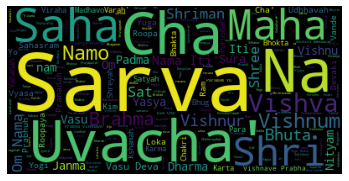

In [41]:
text = shlok["Script"].values 

wordcloud = WordCloud().generate(str(text))
plt.imshow(wordcloud)
plt.axis("off")
plt.show()


<Figure size 432x288 with 0 Axes>

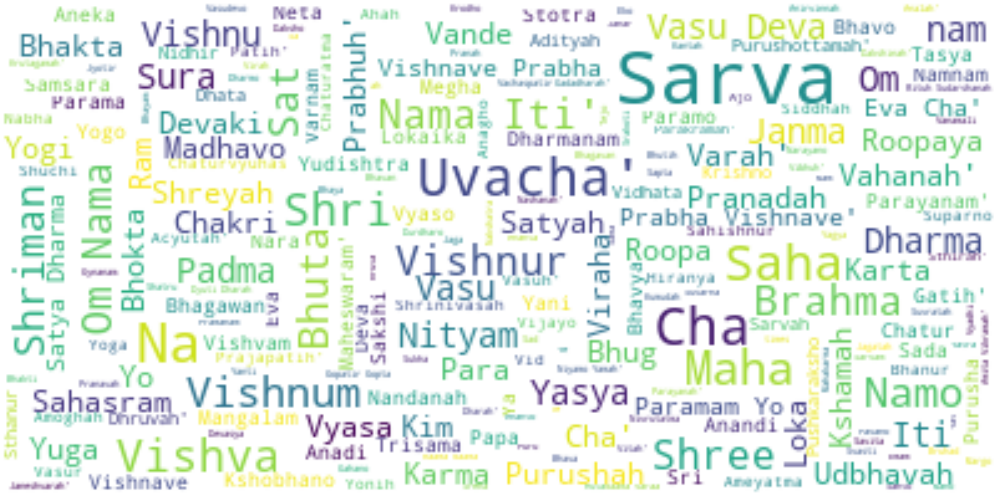

In [53]:
wordcloud = WordCloud(max_font_size=30, max_words=10000, background_color="white").generate(str(text))
plt.figure()
plt.figure(figsize=[70,70])
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.show()

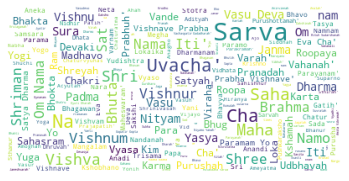

In [54]:
print(wordcloud)
fig = plt.figure(1)
plt.imshow(wordcloud)
plt.axis('off')
plt.show()
#fig.savefig("word1.png", dpi=10000)

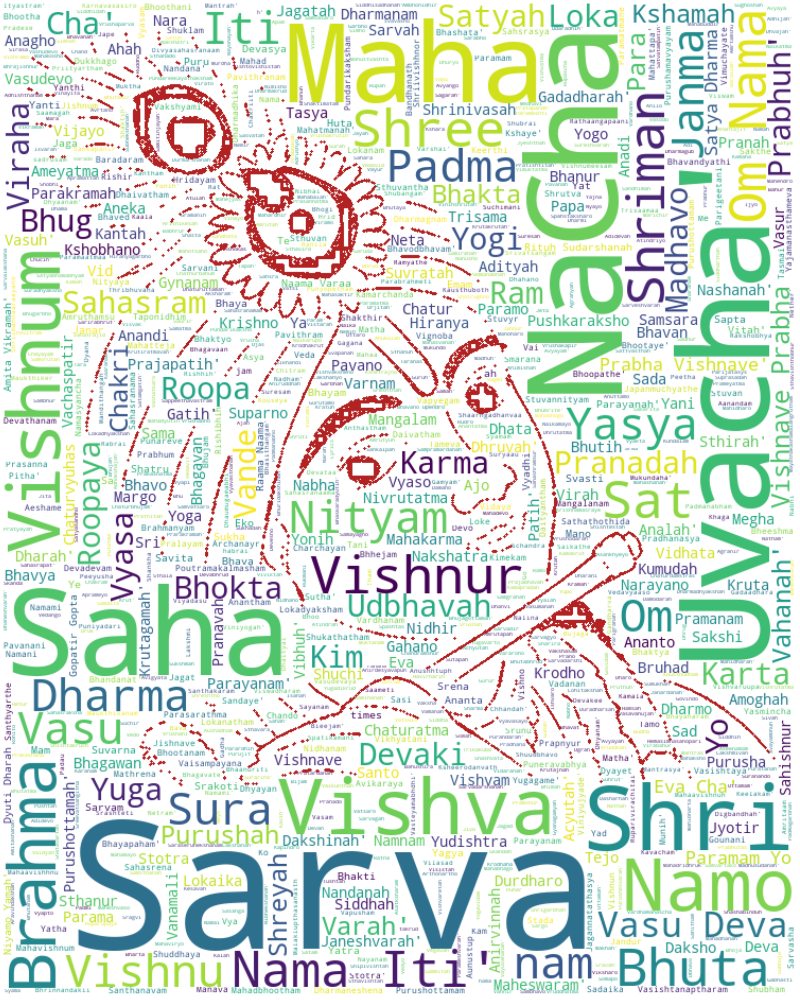

In [81]:
wc = WordCloud(background_color="white", max_words=1000, mask=chak_mask,
                contour_width=3, contour_color='firebrick')


wc.generate(str(text))

wc.to_file("/Users/mr.ravirajkumar/Documents/TextWrap/Krishna.png")

# show
plt.figure(figsize=[50,50])
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
plt.show()

In [73]:
chak_mask = np.array(Image.open("/Users/mr.ravirajkumar/Documents/TextWrap/chakra.jpg"))

In [74]:
chak_mask

array([[[17, 17, 17],
        [16, 16, 16],
        [16, 16, 16],
        ...,
        [13, 13, 13],
        [13, 13, 13],
        [13, 13, 13]],

       [[16, 16, 16],
        [16, 16, 16],
        [15, 15, 15],
        ...,
        [13, 13, 13],
        [13, 13, 13],
        [13, 13, 13]],

       [[16, 16, 16],
        [16, 16, 16],
        [15, 15, 15],
        ...,
        [13, 13, 13],
        [13, 13, 13],
        [13, 13, 13]],

       ...,

       [[13, 13, 13],
        [13, 13, 13],
        [13, 13, 13],
        ...,
        [13, 13, 13],
        [13, 13, 13],
        [13, 13, 13]],

       [[13, 13, 13],
        [13, 13, 13],
        [13, 13, 13],
        ...,
        [13, 13, 13],
        [13, 13, 13],
        [13, 13, 13]],

       [[13, 13, 13],
        [13, 13, 13],
        [13, 13, 13],
        ...,
        [13, 13, 13],
        [13, 13, 13],
        [13, 13, 13]]], dtype=uint8)

In [77]:
def transform_format(val):
    if val == 0:
        return 17
    else:
        return val

In [76]:
trans_chak = np.ndarray((chak_mask.shape[0],chak_mask.shape[0]), np.int8)

for i in range(len(chak_mask)):
    trans_chak[i] = list(map(transform_format, chak_mask[i]))

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()